#Colab 搭配 OpenVINO Pretrained Model 身份辨識範例

使用OpenVINO加上人臉偵測、人臉特徵點及身份辨識預訓練模型完成身份辨識應用。  
參考資料來源：https://docs.openvino.ai/latest/omz_demos_face_recognition_demo_python.html#doxid-omz-demos-face-recognition-demo-python    
歐尼克斯實境互動工作室 OmniXRI Jack, 2022.04.25 整理製作

# 1. 安裝Intel OpenVINO工具包
以apt方式安裝OpenVINO，安裝版本為 2021.4.752  
預設安裝路徑為/opt/intel/OpenVINO_2021.4.752，系統會自建出/opt/intel/OpenVINO_2021捷徑名稱，後續可使用這個較短捷徑名稱。  
若想安裝其它版本，可透過下列指令進行查詢。  
!apt-cache search intel-openvino

In [1]:
# 顯示目前工作目錄
!pwd
# 取得OpenVINO 2021公開金錀
!wget https://apt.repos.intel.com/openvino/2021/GPG-PUB-KEY-INTEL-OPENVINO-2021 
# 加入OpenVINO公開金錀到系統金錀群中
!apt-key add GPG-PUB-KEY-INTEL-OPENVINO-2021 
# 建立更新安裝清單檔案
!touch /etc/apt/sources.list.d/intel-openvino-2021.list
# 將下載指令加入安裝清單中
!echo "deb https://apt.repos.intel.com/openvino/2021 all main" >> /etc/apt/sources.list.d/intel-openvino-2021.list
# 更新系統
!apt update
# 安裝OpenVINO到虛擬機系統中
!apt install intel-openvino-dev-ubuntu18-2021.4.752 
# 列出安裝路徑下內容進行確認
!ls /opt/intel

/content
--2022-04-26 16:10:39--  https://apt.repos.intel.com/openvino/2021/GPG-PUB-KEY-INTEL-OPENVINO-2021
Resolving apt.repos.intel.com (apt.repos.intel.com)... 104.117.52.48, 2600:1408:c400:188::4b23, 2600:1408:c400:186::4b23
Connecting to apt.repos.intel.com (apt.repos.intel.com)|104.117.52.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 939 [binary/octet-stream]
Saving to: ‘GPG-PUB-KEY-INTEL-OPENVINO-2021’

GPG-PUB-KEY-INTEL-O 100%[===================>]     939  --.-KB/s    in 0s      

2022-04-26 16:10:40 (28.6 MB/s) - ‘GPG-PUB-KEY-INTEL-OPENVINO-2021’ saved [939/939]

OK
Hit:1 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:4 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:5 https://apt.repos.intel.com/openvino/2021 all InRelease [5,659 B]
Get:6 http://ppa.launc

# 2. 下載人臉偵測模型
本範例會使用到人臉偵測(Face Dtection)、臉部特徵點偵測(Landmark Detection)及臉部辨識(Face Identification)等預訓練模型。  
主要使用的預訓練模型如下所示：  
*   人臉位置偵測：face-detection-retail-????, face-detection-adas-????  
*   人臉特徵點偵測：landmarks-regression-retail-????  
*   身份辨識：face-reidentification-retail-????, Sphereface, facenet-20180408-102900, face-recognition-resnet100-arcface-onnx  

這裡直接指令特定模型名稱(-name)進行下載，可自行替換相容之模型。    

**注意！執行OpenVINO功能前記得設定環境變數（setupvars.sh），否則會得到錯誤訊息。**


In [2]:
# 執行環境設定批次檔並以模型下載器取得模型
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/downloader.py	 \
       --name face-detection-retail-0004 && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/downloader.py	 \
       --name landmarks-regression-retail-0009 && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/downloader.py	 \
       --name face-reidentification-retail-0095 

[setupvars.sh] OpenVINO environment initialized
################|| Downloading face-detection-retail-0004 ||################

========== Downloading /content/intel/face-detection-retail-0004/FP32/face-detection-retail-0004.xml
... 100%, 103 KB, 769 KB/s, 0 seconds passed

========== Downloading /content/intel/face-detection-retail-0004/FP32/face-detection-retail-0004.bin
... 100%, 2297 KB, 5674 KB/s, 0 seconds passed

========== Downloading /content/intel/face-detection-retail-0004/FP16/face-detection-retail-0004.xml
... 100%, 103 KB, 778 KB/s, 0 seconds passed

========== Downloading /content/intel/face-detection-retail-0004/FP16/face-detection-retail-0004.bin
... 100%, 1148 KB, 3468 KB/s, 0 seconds passed

========== Downloading /content/intel/face-detection-retail-0004/FP16-INT8/face-detection-retail-0004.xml
... 100%, 235 KB, 1192 KB/s, 0 seconds passed

========== Downloading /content/intel/face-detection-retail-0004/FP16-INT8/face-detection-retail-0004.bin
... 100%, 586 KB, 8507 

# 3. 模型優化
如果下載的是Intel's Pretrained Model則不需轉換及優化就自帶IR檔(xml,bin)  
若是Public Pretrained Model則須進行轉換成IR檔，系統會自動判別。  
--name 參數為待轉換模型名稱  

In [3]:
# 下載及安裝test-generator 方便檢查程式運行錯誤
!pip install test-generator==0.1.1

# 執行環境設定批次檔並將下載到的模型檔進行優化轉換產生IR(xml & bin)檔
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/converter.py	 \
       --name face-detection-retail-0004 && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/converter.py	 \
       --name landmarks-regression-retail-0009 && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/converter.py	 \
       --name face-reidentification-retail-0095 

[setupvars.sh] OpenVINO environment initialized
========== Skipping face-detection-retail-0004 (no conversions defined)

========== Skipping landmarks-regression-retail-0009 (no conversions defined)

========== Skipping face-reidentification-retail-0095 (no conversions defined)



檢查模型轉檔後會產生/FP16, FP16-INT8, FP32不同精度的IR檔(xml, bin)

In [4]:
!ls /content/intel/face-detection-retail-0004
!ls /content/intel/face-detection-retail-0004/FP32
!ls /content/intel/landmarks-regression-retail-0009
!ls /content/intel/landmarks-regression-retail-0009/FP32
!ls /content/intel/face-reidentification-retail-0095 
!ls /content/intel/face-reidentification-retail-0095/FP32

FP16  FP16-INT8  FP32
face-detection-retail-0004.bin	face-detection-retail-0004.xml
FP16  FP16-INT8  FP32
landmarks-regression-retail-0009.bin  landmarks-regression-retail-0009.xml
FP16  FP16-INT8  FP32
face-reidentification-retail-0095.bin  face-reidentification-retail-0095.xml


為更清楚了解人臉、身份辨識範例程式可支援的模型，可將models.lst及使用方式列出來確認。（此步驟可忽略）

In [5]:
# 列出範例程式所在目錄內容
!ls /opt/intel/openvino_2021/deployment_tools/inference_engine/demos/face_recognition_demo/python/
# 列出可支援的模型名稱及對應的結構類型(architecture_type)
!cat /opt/intel/openvino_2021/deployment_tools/inference_engine/demos/face_recognition_demo/python/models.lst
# 列出身份辨識程式的參數說明文件
!cat /opt/intel/openvino_2021/deployment_tools/inference_engine/demos/face_recognition_demo/python/README.md

face_detector.py	  ie_module.py		 README.md
face_identifier.py	  __init__.py		 requirements.txt
face_recognition_demo.py  landmarks_detector.py  utils.py
faces_database.py	  models.lst
# This file can be used with the --list option of the model downloader.
face-detection-adas-????
face-detection-retail-????
Sphereface
face-recognition-resnet100-arcface-onnx
face-reidentification-retail-????
facenet-20180408-102900
landmarks-regression-retail-????
# Face Recognition Python\* Demo

This example demonstrates an approach to create interactive applications
for video processing. It shows the basic architecture for building model
pipelines supporting model placement on different devices and simultaneous
parallel or sequential execution using OpenVINO library in Python.
In particular, this demo uses 3 models to build a pipeline able to detect
faces on videos, their keypoints (aka "landmarks"),
and recognize persons using the provided faces database (the gallery).
The following pretrained model

# 4. 準備測試用影像及影片

## 4.1 下載測試影像

從網路獲取任意一張測試影像並另存成face.jpg並顯示。  
若要從Github中取得影像時，需將原檔案路徑修改為原始檔型式。  
首先在Github原始影像上以滑鼠右鍵點擊，選擇「複製圖片鏈結」取得影像原始網址： https://github.com/OmniXRI/Colab_DevCloud_OpenVINO_Samples/blob/main/dataset/face_detection_01.jpg  
接著修改後檔名：主要是將github.com變成raw.githubusercontent.com，把/blob/main改成master路徑名稱，其它子路徑保留  
https://raw.githubusercontent.com/OmniXRI/Colab_DevCloud_OpenVINO_Samples/master/dataset/face_detection_01.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  # Remove the CWD from sys.path while we load stuff.


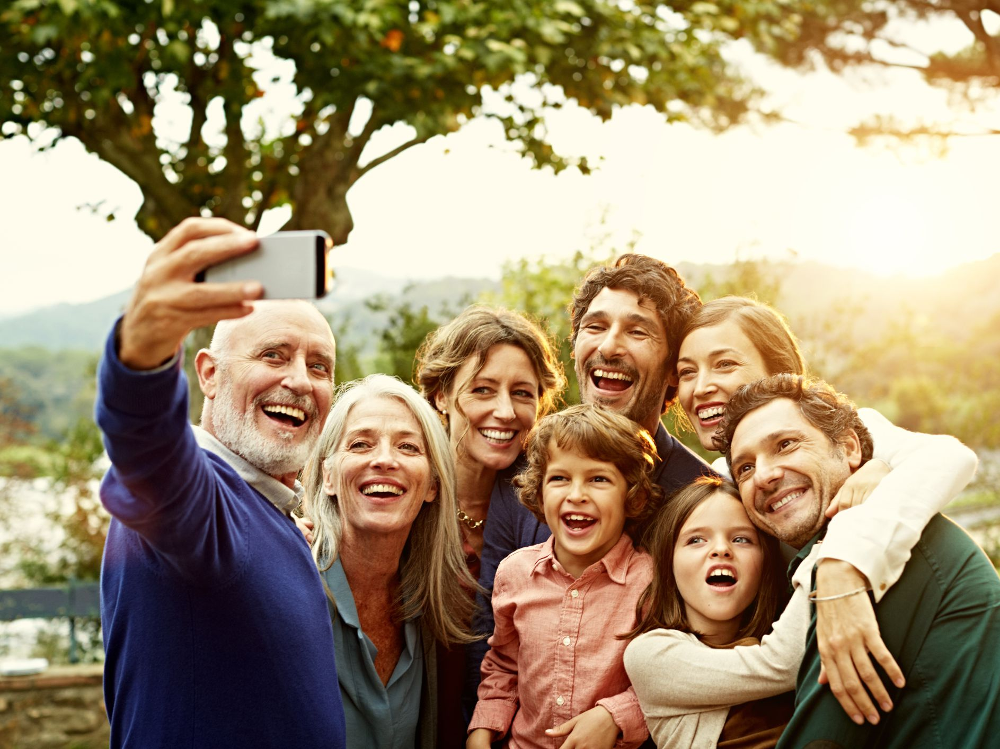

In [6]:
# 以OpenCV檢視輸入影像
import cv2 # 導入OpenCV套件包
from google.colab.patches import cv2_imshow # 導入顯示OpenCV格式影像套件包
import numpy as np # 導入numpy套件包
import requests # 導入requests套件包

# 從網路獲取一張影像
file = requests.get("https://raw.githubusercontent.com/OmniXRI/Colab_DevCloud_OpenVINO_Samples/master/dataset/face_detection_01.jpg")
# 將影像轉成OpenCV格式
img = cv2.imdecode(np.fromstring(file.content, np.uint8), 1)
cv2.imwrite('face.jpg',img)
cv2_imshow(img) # 顯示輸入影像

## 4.2 下載測試影片

由於Colab只支援H.264編碼格式的mp4影片顯示，所以要先ffmpeg進行格式轉換，再顯示。

In [7]:
# 取得測試影片
!wget https://raw.githubusercontent.com/OmniXRI/Colab_DevCloud_OpenVINO_Samples/master/dataset/gaze_demo.mp4

--2022-04-26 16:11:56--  https://raw.githubusercontent.com/OmniXRI/Colab_DevCloud_OpenVINO_Samples/master/dataset/gaze_demo.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2381077 (2.3M) [application/octet-stream]
Saving to: ‘gaze_demo.mp4’

gaze_demo.mp4       100%[===================>]   2.27M  --.-KB/s    in 0.01s   

2022-04-26 16:11:57 (211 MB/s) - ‘gaze_demo.mp4’ saved [2381077/2381077]



顯示下載到的影片內容（可略過）

由於Colab只能顯示H.264編碼格式的mp4影片檔案，所以要先以ffmpeg轉檔，再進行顯示。

In [8]:
# 以ffmpeg將mp4檔案轉成H.264編碼格式的mp4檔案
!ffmpeg -i /content/gaze_demo.mp4 -vcodec libx264 /content/gaze_demo_x264.mp4

from IPython.display import HTML
from base64 import b64encode

vs_out = open('/content/gaze_demo_x264.mp4','rb').read() # 開啟並讀取mp4格式視頻檔
data_url = "data:video/mp4;base64," + b64encode(vs_out).decode() # 設定顯示內容格式
HTML(f'<video width=600 controls><source src={data_url} type="video/mp4"></video>') # 將視頻顯示於視窗上

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

## 4.3 準備人臉資料庫影像

建立資料庫路徑（如face_gallery），內存放已知人臉照片(jpg, png等格式），可以同一人只有1張（如jack.jpg），亦可同一人有多張（如jack-0.jpg, jack-1.jpg...）。圖片大小、人臉大小、人臉角度亦不据。  


In [9]:
# 建立存放人臉資料庫的路徑
!mkdir face_gallery

/content/face_gallery
--2022-04-26 16:12:31--  https://raw.githubusercontent.com/OmniXRI/Colab_DevCloud_OpenVINO_Samples/master/dataset/gaze_man.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27041 (26K) [image/jpeg]
Saving to: ‘gaze_man.jpg’

gaze_man.jpg        100%[===================>]  26.41K  --.-KB/s    in 0.001s  

2022-04-26 16:12:31 (49.6 MB/s) - ‘gaze_man.jpg’ saved [27041/27041]

/content


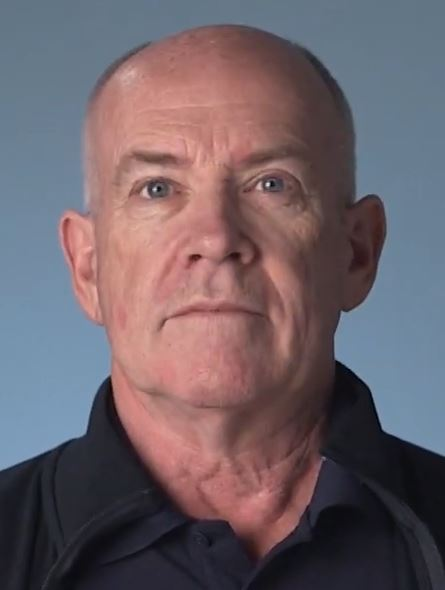

In [10]:
# 取得人臉資料並放入資料庫中
%cd face_gallery
!wget https://raw.githubusercontent.com/OmniXRI/Colab_DevCloud_OpenVINO_Samples/master/dataset/gaze_man.jpg
%cd ..

# 讀入並顯示人臉資料庫影像
face_img = cv2.imread("/content/face_gallery/gaze_man.jpg")
cv2_imshow(face_img)

#5. 進行推論
執行環境設定批次檔並執行推論  

輸入參數：  
-d 執行裝置，預設為CPU (Colab提供的Intel Xeon CPU),Colab不支援Intel的GPU,MYRIAD(VPU),FPGA   
-i 輸入影像/影片/攝影機名稱 (\*.png, \*.jpg, \*.mp4, cam-id ...)  
-m_fd 人臉偵測模型名稱 (\*.xml)  
-m_lm 人臉特徵點模型名稱 (\*.xml)  
-m_reid 人臉特徵點模型名稱 (\*.xml) 
-fg 人臉影像路徑（存放已認可的人臉影像）
--run_detector 執行人臉偵測  
--allow_grow 允許自動新增人臉資料庫（可略）  
--no_show 執行過程中不顯示，在Colab上一定要使用，不然會報錯
--verbose 是否輸出訊息  
-o 輸出影像/影片名稱 (\*.png, \*.jpg, \*.mp4)  

## 5.1 單張影像身份辨識

輸入影像名稱：face.jpg  
輸出影像名稱：output.jpg  
以Colab cv2_imshow()顯示結果影像  

[setupvars.sh] OpenVINO environment initialized
/usr/local/lib/python3.7/dist-packages/scipy/fft/__init__.py:97: DeprecationWarning: The module numpy.dual is deprecated.  Instead of using dual, use the functions directly from numpy or scipy.
  from numpy.dual import register_func
/usr/local/lib/python3.7/dist-packages/scipy/sparse/sputils.py:17: DeprecationWarning: `np.typeDict` is a deprecated alias for `np.sctypeDict`.
  supported_dtypes = [np.typeDict[x] for x in supported_dtypes]
/usr/local/lib/python3.7/dist-packages/scipy/special/orthogonal.py:81: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy

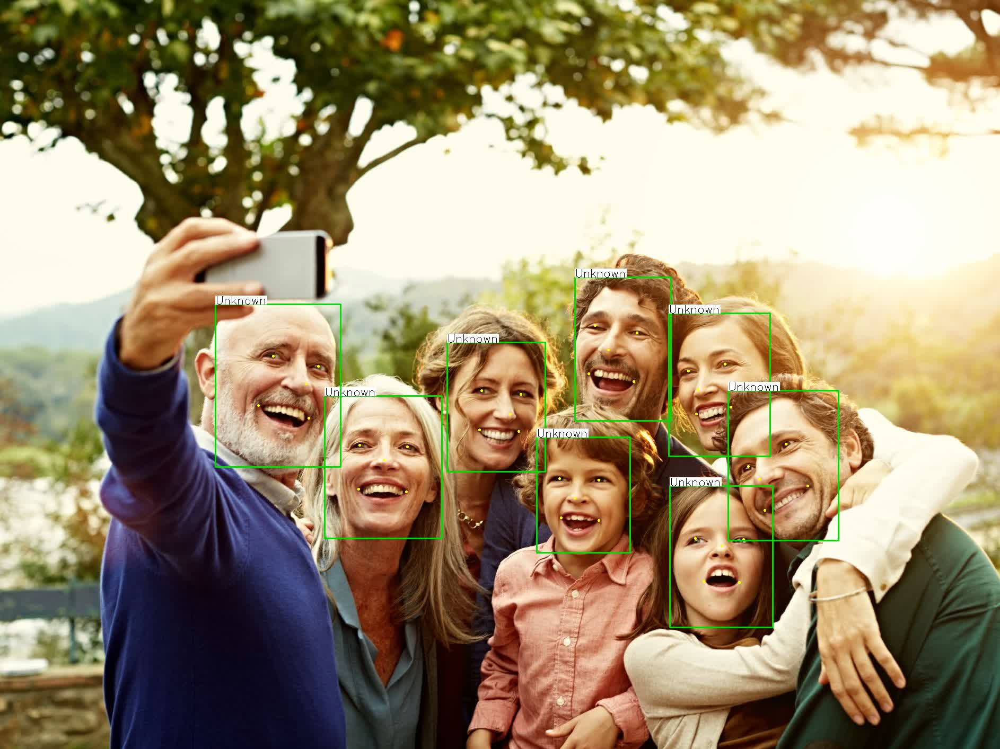

In [11]:
# 執行環境設定批次檔並執行推論(單張影像輸入)
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python \
/opt/intel/openvino_2021/deployment_tools/inference_engine/demos/face_recognition_demo/python/face_recognition_demo.py \
  -i /content/face.jpg \
  -m_fd /content/intel/face-detection-retail-0004/FP32/face-detection-retail-0004.xml \
  -m_lm /content/intel/landmarks-regression-retail-0009/FP32/landmarks-regression-retail-0009.xml \
  -m_reid /content/intel/face-reidentification-retail-0095/FP32/face-reidentification-retail-0095.xml \
  -fg "/content/face_gallery" \
  --run_detector \
  --allow_grow \
  --no_show \
  --verbose \
  -o output.jpg

out_img = cv2.imread("output.jpg") # 讀入結果影像
cv2_imshow(out_img) # 顯示結果影像 

## 5.2 以影片進行身份辨識

輸入影像名稱：gaze_demo.mp4  
輸出影像名稱：output.avi  
由於Colab只能顯示H.264編碼格式的mp4影片檔案，所以要先以ffmpeg轉檔，再進行顯示。  

In [12]:
# 執行環境設定批次檔並執行推論(單張影像輸入)
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python \
/opt/intel/openvino_2021/deployment_tools/inference_engine/demos/face_recognition_demo/python/face_recognition_demo.py \
  -i /content/gaze_demo.mp4 \
  -m_fd /content/intel/face-detection-retail-0004/FP32/face-detection-retail-0004.xml \
  -m_lm /content/intel/landmarks-regression-retail-0009/FP32/landmarks-regression-retail-0009.xml \
  -m_reid /content/intel/face-reidentification-retail-0095/FP32/face-reidentification-retail-0095.xml \
  -fg "/content/face_gallery" \
  --run_detector \
  --allow_grow \
  --no_show \
  --verbose \
  -o output.avi

[setupvars.sh] OpenVINO environment initialized
/usr/local/lib/python3.7/dist-packages/scipy/fft/__init__.py:97: DeprecationWarning: The module numpy.dual is deprecated.  Instead of using dual, use the functions directly from numpy or scipy.
  from numpy.dual import register_func
/usr/local/lib/python3.7/dist-packages/scipy/sparse/sputils.py:17: DeprecationWarning: `np.typeDict` is a deprecated alias for `np.sctypeDict`.
  supported_dtypes = [np.typeDict[x] for x in supported_dtypes]
/usr/local/lib/python3.7/dist-packages/scipy/special/orthogonal.py:81: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy

In [13]:
# 以ffmpeg將avi檔案轉成H.264格式的mp4檔案
!ffmpeg -i /content/output.avi -vcodec libx264 /content/output_x264.mp4

from IPython.display import HTML
from base64 import b64encode

vs_out = open('/content/output_x264.mp4','rb').read() # 開啟並讀取mp4格式視頻檔
data_url = "data:video/mp4;base64," + b64encode(vs_out).decode() # 設定顯示內容格式
HTML(f'<video width=600 controls><source src={data_url} type="video/mp4"></video>') # 將視頻顯示於視窗上

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib